<a href="https://colab.research.google.com/github/Ajay-user/Ajay-user/blob/main/Working%20with%20images/Convolution_101_detecting_edges_ipynb.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [6]:
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns

### The feature extraction , three basic operations:

* Filter an image for a particular feature (convolution)
* Detect that feature within the filtered image (ReLU)
* Condense the image to enhance the features (maximum pooling)

## Load the image

In [ ]:
# author https://unsplash.com/@aahubs
url = "https://images.unsplash.com/photo-1618863099278-75222d755814?ixlib=rb-1.2.1&ixid=MnwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8&auto=format&fit=crop&w=870&q=80"

file = tf.keras.utils.get_file('car',origin=url)

In [ ]:
# reading the image
raw = tf.io.read_file(file)
# decode
img = tf.image.decode_jpeg(raw)

Let's view the image

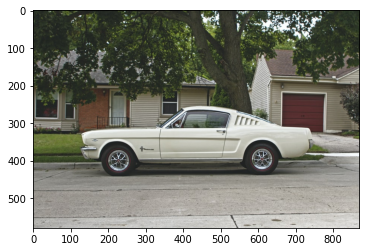

In [ ]:
plt.imshow(img);

## Edge detection

For the filtering step, we'll define a kernel and then apply it with the convolution. The kernel in this case is an "edge detection" kernel. You can define it with tf.constant just like you'd define an array in Numpy with np.array.

In [2]:
kernel = tf.constant([
    [-1, -1, -1],
    [-1,  8, -1],
    [-1, -1, -1],
])

In [ ]:
kernel3d = tf.stack([kernel,kernel,kernel],axis=2)
kernel3d.shape

TensorShape([3, 3, 3])

In [ ]:
# input tensor of shape batch_shape + [in_height, in_width, in_channels]
# convert to float dtype
input_img = tf.image.convert_image_dtype(img, tf.float32)
# add batch dimension to the image
input_img = tf.expand_dims(input_img, axis=0)

# filter / kernel tensor of shape [filter_height, filter_width, in_channels, out_channels]
input_kernel = tf.reshape(kernel3d, shape=[*kernel.shape,3,1])
input_kernel = tf.cast(input_kernel, dtype=tf.float32)

In [ ]:
print(f'Input image shape : {input_img.shape}\nKernel shape : {input_kernel.shape}')

Input image shape : (1, 580, 870, 3)
Kernel shape : (3, 3, 3, 1)


## Convolution operation

In [ ]:
filtered_img = tf.nn.conv2d(input=input_img, filters=input_kernel, strides=1, padding='SAME')

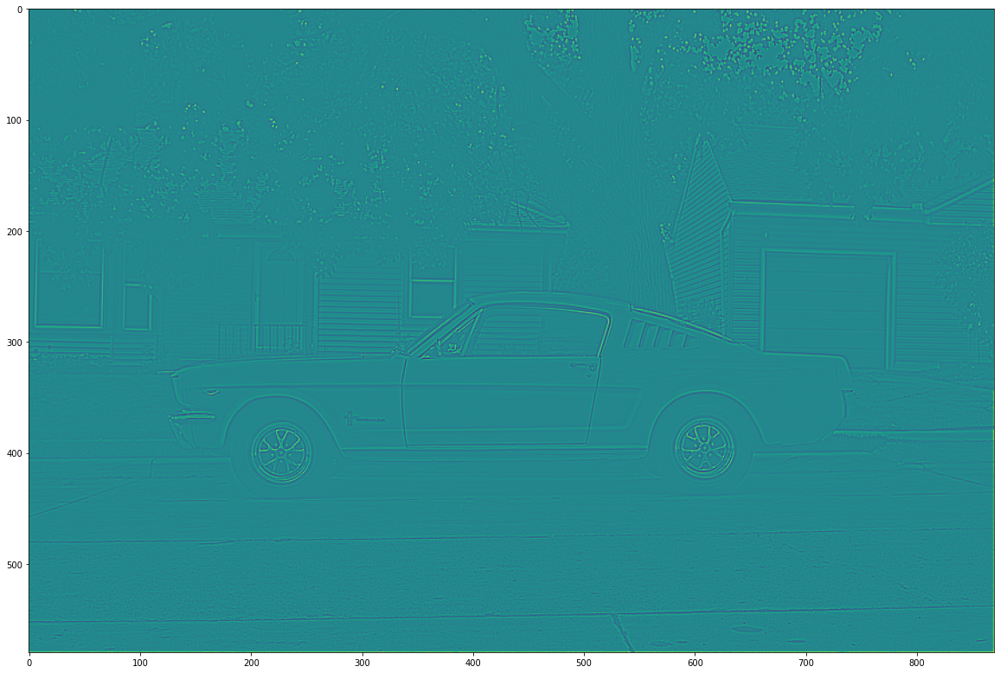

In [ ]:
plt.figure(figsize=(20,30))
plt.imshow(tf.squeeze(filtered_img))

## Applying Nonlinear activation

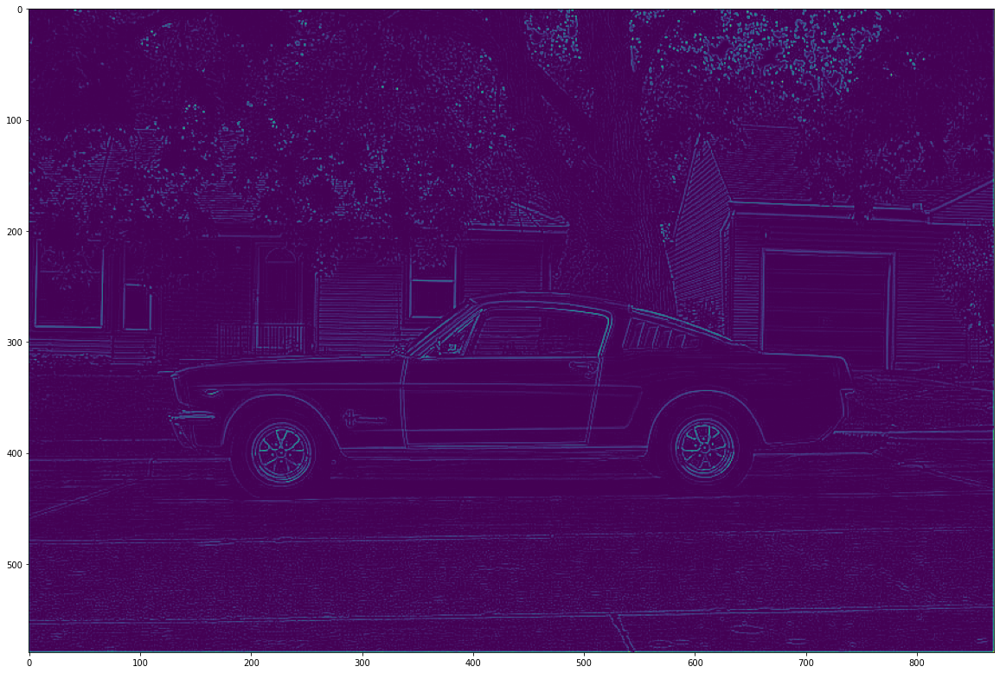

In [ ]:
# lets apply ReLU
image_detect = tf.nn.relu(filtered_img)

plt.figure(figsize=(20,30))
plt.imshow(tf.squeeze(image_detect));

## Convolution kernels

You have your choice of what kind of kernel to apply. One thing to keep in mind is that the sum of the numbers in the kernel determines how bright the final image is. Generally, you should try to keep the sum of the numbers between 0 and 1 .

In general, a kernel can have any number of rows and columns. Let's use a  3×3  kernel, which often gives the best results. 

In [4]:

# PREDEFINED KERNELS #

# Edge detection
edge = tf.constant(
    [[-1, -1, -1],
     [-1, 8, -1],
     [-1, -1, -1]],
)

# Blur
blur = tf.constant(
    [[0.0625, 0.125, 0.0625],
     [0.125, 0.25, 0.125],
     [0.0625, 0.125, 0.0625]],
)

# Bottom sobel
bottom_sobel = tf.constant(
    [[-1, -2, -1],
     [0, 0, 0],
     [1, 2, 1]],
)

# Emboss South-East
emboss = tf.constant(
    [[-2, -1, 0],
     [-1, 1, 1],
     [0, 1, 2]],
)

# Sharpen
sharpen = tf.constant(
    [[0, -1, 0],
     [-1, 5, -1],
     [0, -1, 0]],
)

In [47]:
# lets create an util for displaying the kernels
def display_kernel(kernel, ax, fontsize=18):
  sns.heatmap(kernel,
              annot=True,
              annot_kws={"size": fontsize},
              cbar=False,
              cmap='flare',
              xticklabels=False,
              yticklabels=False,
              square=True,
              ax=ax
              );

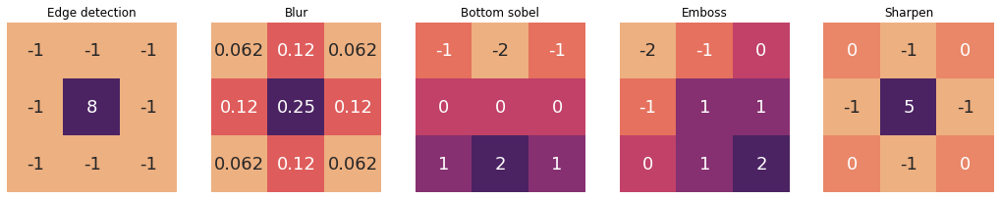

In [48]:
from IPython.core.pylabtools import figsize
kernels = [('Edge detection',edge), ('Blur',blur), ('Bottom sobel',bottom_sobel), ('Emboss',emboss), ('Sharpen',sharpen)]

fig, ax = plt.subplots(nrows=1, ncols=5, figsize=(18,18))
for i, (n, k) in enumerate(kernels):
  ax[i].set_title(n)
  display_kernel(k, ax[i])
  

## Utility function 

In [3]:
def edge_detection(image_url, kernel, is_color_image=True, figsize=(10,10)):
  file = tf.keras.utils.get_file(origin=url)
  # reading the image
  raw = tf.io.read_file(file)
  # decode
  img = tf.image.decode_jpeg(raw, channels=1) if not is_color_image else tf.image.decode_jpeg(raw, channels=3)

  # image => input tensor of shape batch_shape + [in_height, in_width, in_channels]
  input_img = tf.expand_dims(img, axis=0)
  # convert to float dtype
  input_img = tf.image.convert_image_dtype(input_img, tf.float32)
    
  # kernel => input tensor of shape batch_shape + [in_height, in_width, in_channels]
  input_kernel = kernel if not is_color_image else tf.stack([kernel]*3, axis=2)
  # filter / kernel tensor of shape [filter_height, filter_width, in_channels, out_channels]
  input_kernel = tf.reshape(input_kernel, shape=[*input_kernel.shape,1,1]) if not is_color_image else tf.reshape(input_kernel, shape=[*input_kernel.shape,1])
  input_kernel = tf.cast(input_kernel, dtype=tf.float32)


  # convolution opereation
  filtered_img = tf.nn.conv2d(input=input_img, filters=input_kernel, strides=1, padding='SAME')

  # applying relu activation
  image_detect = tf.nn.relu(filtered_img)

  # visualization

  plt.figure(figsize=figsize)
  plt.subplot(3,1,1)
  plt.imshow(tf.squeeze(img))
  plt.title('Input image')
  plt.figure(figsize=figsize)
  plt.subplot(3,1,2)
  plt.imshow(tf.squeeze(filtered_img))
  plt.title('Convolution output before applying activation function')
  plt.axis('off')  
  plt.subplot(3,1,3)
  plt.imshow(tf.squeeze(image_detect))
  plt.title('Convolution output after applying activation function ReLU')
  plt.axis('off')


  return filtered_img, image_detect

## Examples

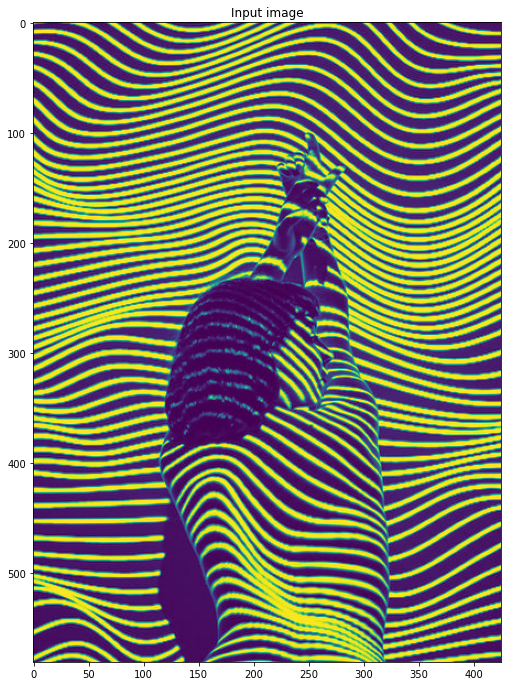

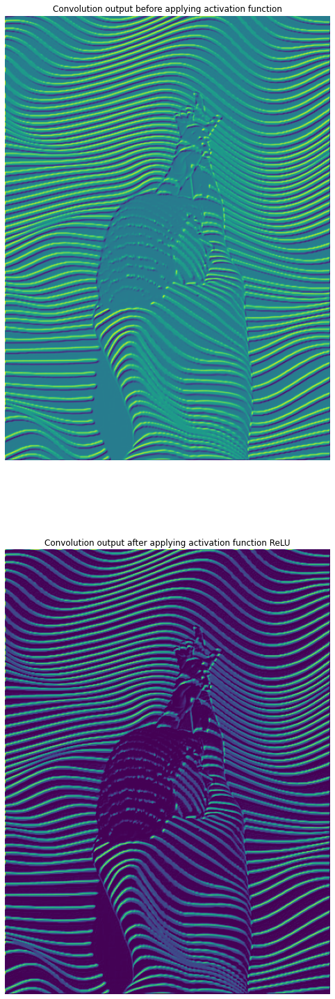

In [53]:
# https://unsplash.com/@lilianpereir
url = 'https://images.unsplash.com/photo-1529432337323-223e988a90fb?ixlib=rb-1.2.1&ixid=MnwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8&auto=format&fit=crop&w=425&q=80'

filtered_image, image_detect = edge_detection(url, emboss, is_color_image=False, figsize=(20,40))


122880/107898 [==================================] - 0s 0us/step


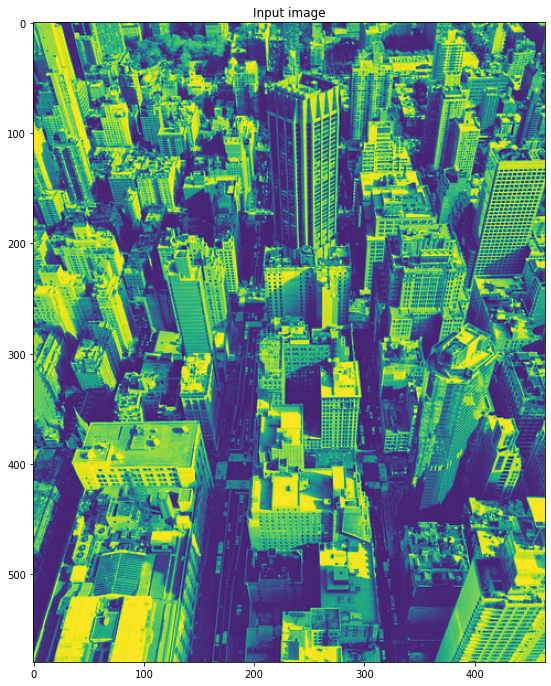

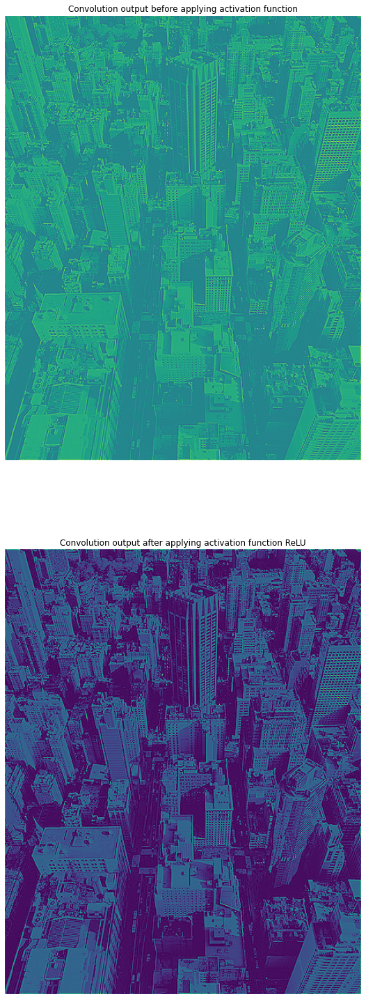

In [51]:
# author = https://unsplash.com/@pipeaguileram
url = 'https://images.unsplash.com/photo-1494768788897-7fdaa00de2a1?ixlib=rb-1.2.1&ixid=MnwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8&auto=format&fit=crop&w=464&q=80'
filtered_image, image_detect = edge_detection(url, sharpen, is_color_image=False, figsize=(20,40))

32768/19588 [==================================================] - 0s 0us/step


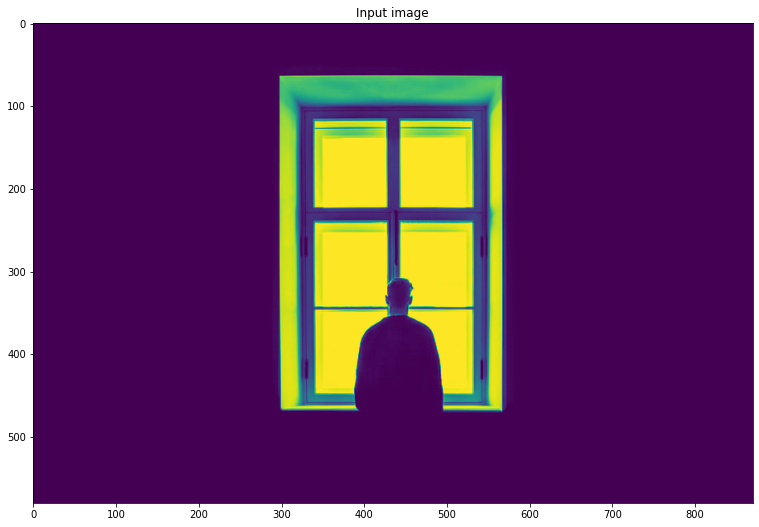

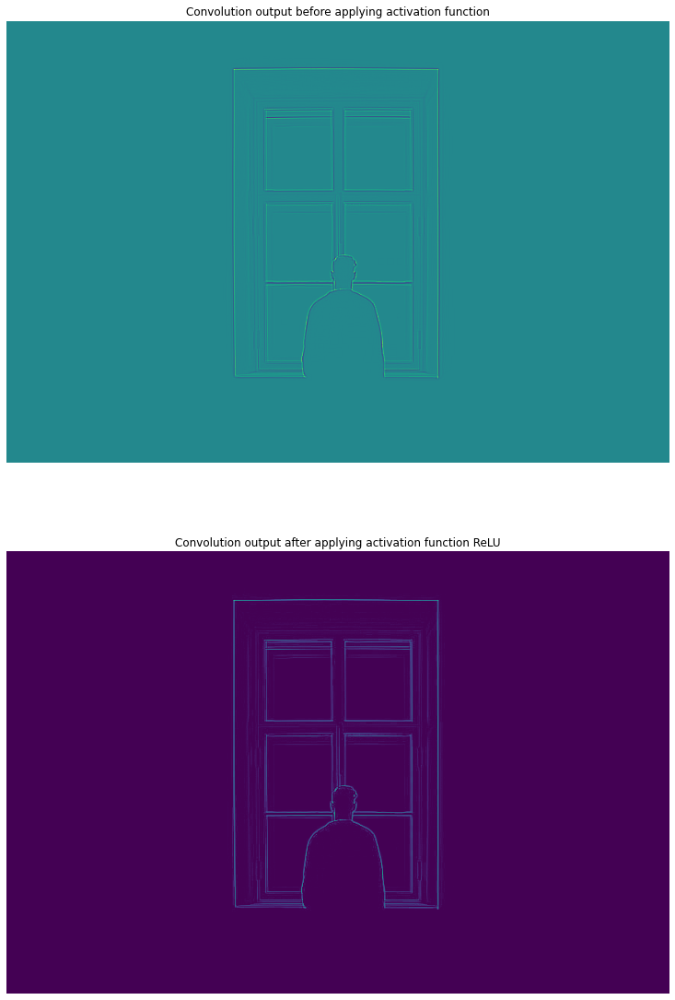

In [54]:
# author = https://unsplash.com/@sashafreemind
url = 'https://images.unsplash.com/photo-1534330207526-8e81f10ec6fc?ixlib=rb-1.2.1&ixid=MnwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8&auto=format&fit=crop&w=870&q=80'
filtered_image, image_detect = edge_detection(url, edge, is_color_image=False, figsize=(20,30))

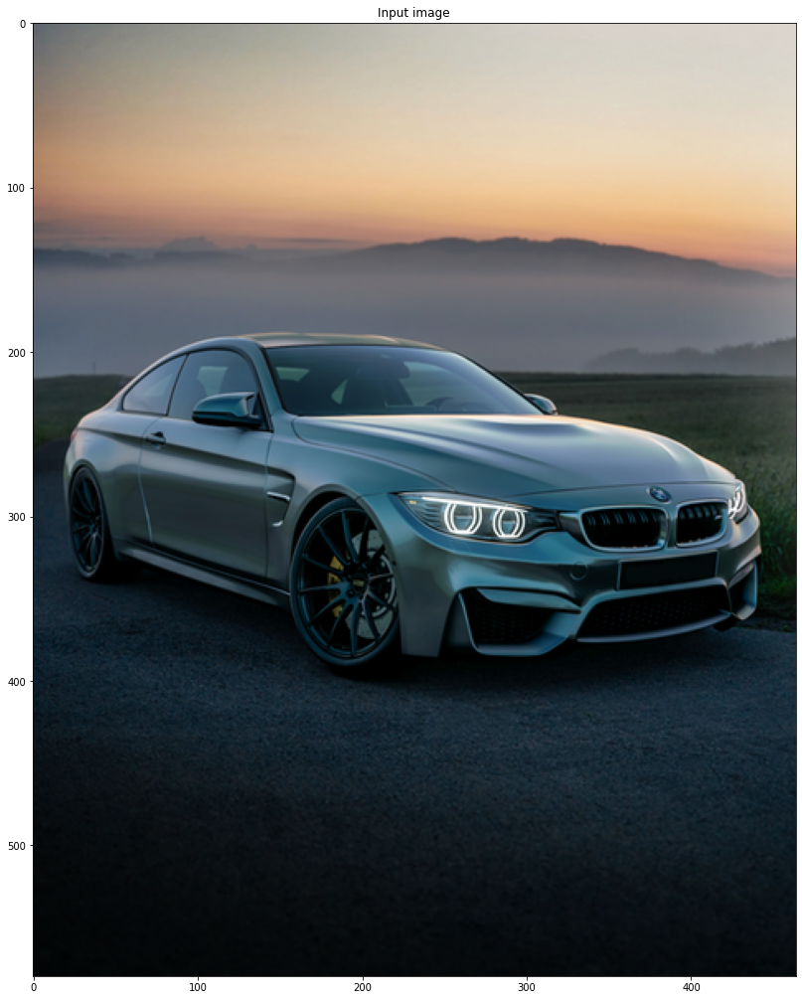

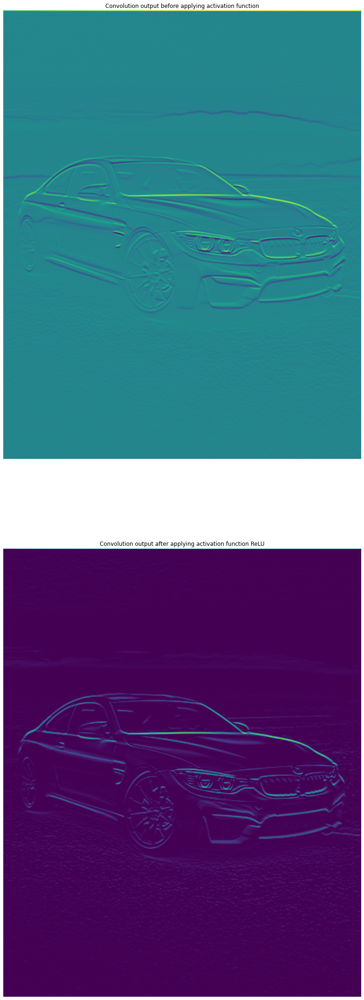

In [55]:
# author https://unsplash.com/@bbtl
url = "https://images.unsplash.com/photo-1580273916550-e323be2ae537?ixlib=rb-1.2.1&ixid=MnwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8&auto=format&fit=crop&w=464&q=80"
filtered_image, image_detect = edge_detection(url, bottom_sobel, is_color_image=True, figsize=(30,60))

98304/84280 [==================================] - 0s 0us/step


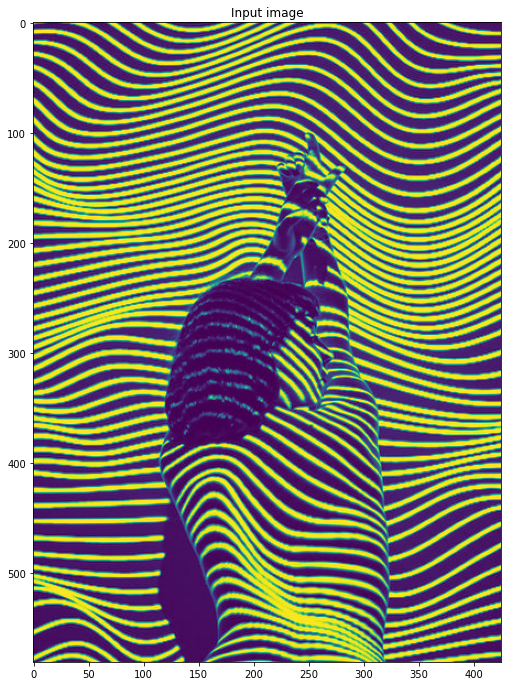

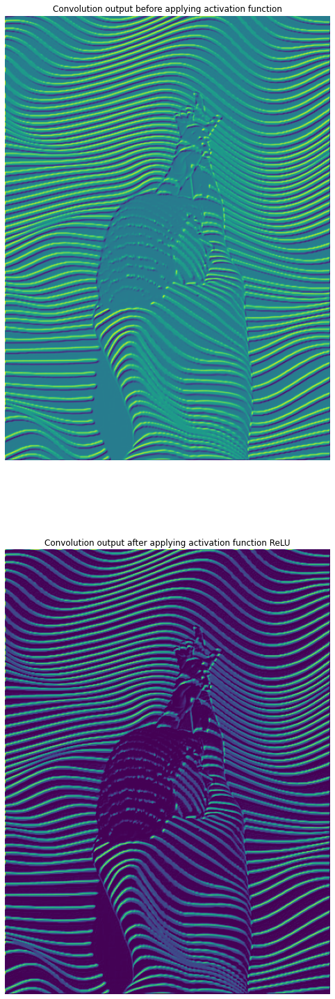

In [49]:
# https://unsplash.com/@lilianpereir
url = 'https://images.unsplash.com/photo-1529432337323-223e988a90fb?ixlib=rb-1.2.1&ixid=MnwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8&auto=format&fit=crop&w=425&q=80'

filtered_image, image_detect = edge_detection(url, emboss, is_color_image=False, figsize=(20,40))

335872/324485 [===============================] - 0s 0us/step


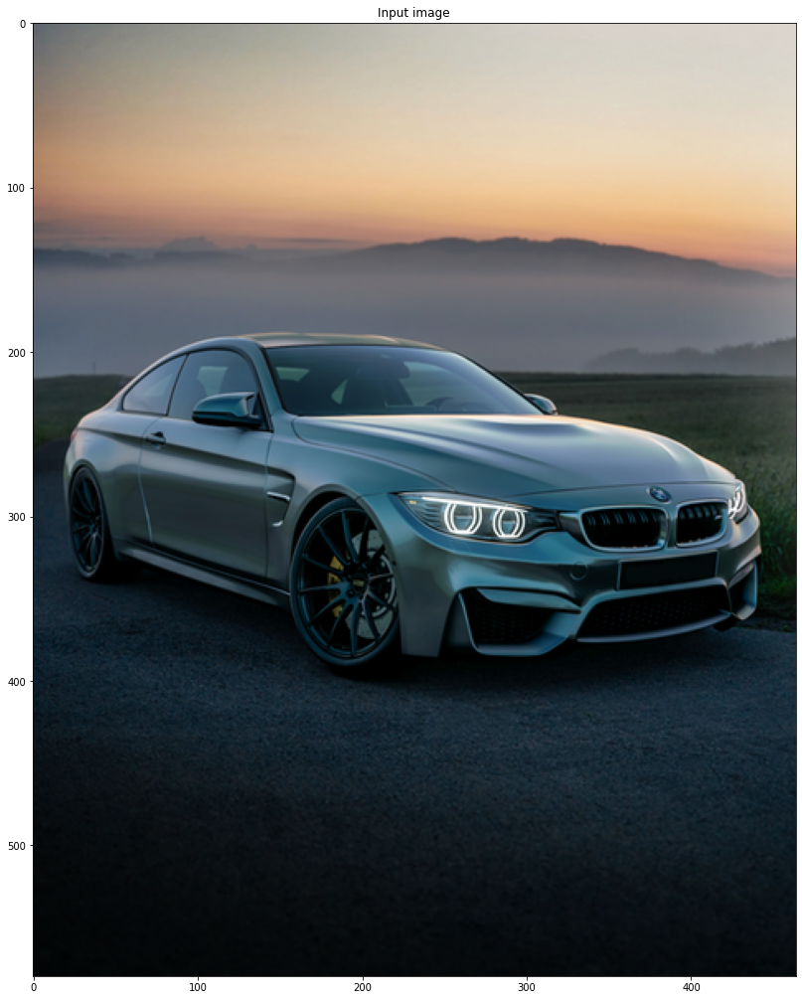

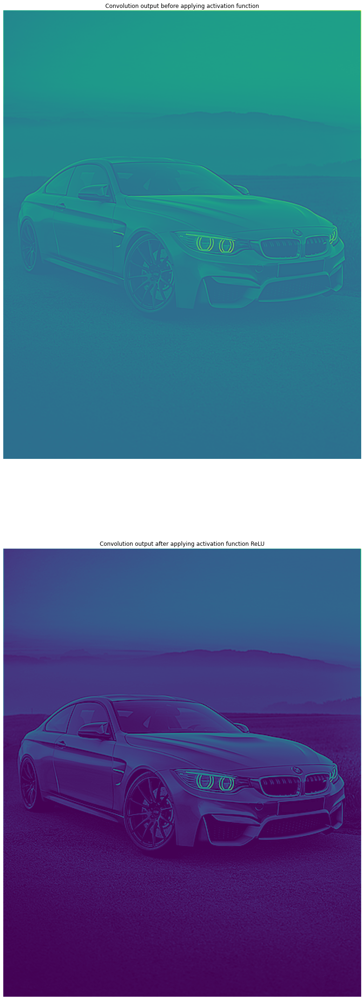

In [50]:
# author https://unsplash.com/@bbtl
url = "https://images.unsplash.com/photo-1580273916550-e323be2ae537?ixlib=rb-1.2.1&ixid=MnwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8&auto=format&fit=crop&w=464&q=80"
filtered_image, image_detect = edge_detection(url, sharpen, is_color_image=True, figsize=(30,60))